# **Distance Predictor Part 2**
Author: Declan Costello

Date: 8/6/2023

## **Part 2 Description**

Here I created features and then further explored these new trends

## **Table of Context**

1. [Installation](#Installation)
2. [Inspecting Data](#Inspecting-Data)
3. [Cleaning Data](#Cleaning-Data)
4. [Feature Engineering](#Feature-Engineering)
5. [Feature Explortion](#Feature-Explortion)
6. [Future Analysis](#Future-Analysis)

# **Installation**

The following installs the necessary packages

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
#import plotly.express as px
import matplotlib.pyplot as plt

pd.set_option('mode.chained_assignment', None)

## **Inspecting Data**

In [2]:
data = pd.read_csv('pybaseball_2022.csv')
data = data[data['hit_distance_sc'].notna()]

In [3]:
data = data[data['events'].isin(["field_out", "single", "double",  "triple", "home_run"])]

data = data[['hit_distance_sc','launch_angle','launch_speed', "hc_x", "hc_y","pfx_x", "pfx_z", "release_speed", "events", "home_team", "pitch_type", "stand", "p_throws", "woba_value"]]

In [4]:
print(data.shape)

data.isnull().sum().sort_values(ascending=False)

(116316, 14)


launch_speed       112
hc_x                38
hc_y                38
pfx_x               11
pfx_z                9
release_speed        7
launch_angle         2
hit_distance_sc      0
events               0
home_team            0
pitch_type           0
stand                0
p_throws             0
woba_value           0
dtype: int64

## **Cleaning Data**

In [5]:
data = data[data['hc_x'].notna()]
data = data[data['hc_y'].notna()]
data = data[data['pfx_x'].notna()]
data = data[data['pfx_z'].notna()]
data = data[data['launch_angle'].notna()]
data = data[data['launch_speed'].notna()]
data = data[data['release_speed'].notna()]

# **Feature Engineering**
The following is a list of the important features I created for future models:

*   [**Platoon Splits**](#Platoon-Splits) - In baseball, launch angle is the vertical angle at which the ball leaves the player's bat after being struck. It's measured in relation to the ground. A high launch angle means the ball will go further and higher into the air, and a low launch angle means the ball will go lower and not as far. 

*   [**Pitch Type**](#Pitch-Type) - In Major League Baseball (MLB), a pitch type is a classification of a pitch based on its speed, movement, and trajectory. There are many different pitch types, each with its own unique characteristics.

*   [**Dome**](#Dome) - A domed stadium is a stadium with a roof that covers the entire playing field and stands. This type of stadium is designed to protect fans from the elements, such as rain, snow, and extreme heat. 

*   [**Elevation**](#Elevation) - Elevation is a distance measurement, usually in the vertical or "up" direction, between a reference datum and sea level.

*   [**Spray**](#Spray) - The term "spray" refers to where a batter hits the ball on the field. A "spray hitter" is a batter who has a relatively even distribution of batted balls to all three fields.

*   [**Pull**](#pull-percent) - “Pulling” a ball means to hit it sharply along the line from the side of the plate you stand on. If you are a right-handed hitter, pulling a pitch means you have hit it toward the third-base line, either fair or foul.

*   [**Pop**](#pop-speed) - Exit Velo - Release Speead, Is the ball popping off the bat faster than the pitcher is throwing it? Because of the lack of data in this data set, This stat is an attempt to measure quality contact.

*   [**Barrel**](#Barrel) - In MLB, the term "barrel" refers to a batted ball that is hit with a combination of high exit velocity and optimal launch angle. Barrels are more likely to produce hits, particularly extra-base hits, than non-barrels.

        To be classified as a barrel, a batted ball must meet the following criteria:

    - Exit velocity of at least 98 miles per hour
    - Launch angle of between 26 and 30 degrees

# **Platoon Splits**

 - 0 --> bad batting matchup
 - 1 --> good batting matchup

In [6]:
data['fav_platoon_split_for_batter'] = np.where(data['stand']!= data['p_throws'], 'Yes', 'No')


# **Pitch Type**

 - 0 --> fastball
 - 1 --> breaking
 - 2 --> offspeed

In [7]:
pitch_type_grouped = {
    'FF':'fastball',
    'SI':'fastball',
    'SL':'breaking',
    'CH':'offspeed',
    'FC':'fastball',
    'CU':'breaking',
    'ST':'breaking',
    'KC':'breaking',
    'FS':'offspeed',
    'SV':'breaking',
    'FA':'fastball',
    'EP':'offspeed',
    'CS':'breaking',
    'KN':'offspeed'
}

data['grouped_pitch_type'] = data['pitch_type'].map(pitch_type_grouped)

# **Dome**

- 0 --> no roof
- 1 --> roof

In [8]:
Domed_Stadiums = {
    'COL':0,
    'PHI':0,
    'AZ':1,
    'TOR':1,
    'STL':0,
    'NYY':0,
    'CLE':0,
    'KC':0,
    'PIT':0,
    'MIN':0,
    'DET':0,
    'WSH':0,
    'CWS':0,
    'NYM':0,
    'BOS':0,
    'BAL':0,
    'MIA':1,
    'OAK':0,
    'HOU':1,
    'SD':0,
    'LAD':0,
    'TEX':1,
    'SEA':1,
    'LAA':0,
    'CIN':0,
    'CHC':0,
    'TB':1,
    'SF':0,
    'ATL':0,
    'MIL':1
}

data['domed'] = data['home_team'].map(Domed_Stadiums)

# **Elevation**

- stadium --> ft in elevation

In [9]:
Stadium_elevation = {
    'COL':5183,
    'PHI':9,
    'AZ':1082,
    'TOR':247,
    'STL':455,
    'NYY':54,
    'CLE':582,
    'KC':750,
    'PIT':743,
    'MIN':812,
    'DET':596,
    'WSH':25,
    'CWS':596,
    'NYM':54,
    'BOS':20,
    'BAL':130,
    'MIA':15,
    'OAK':42,
    'HOU':38,
    'SD':13,
    'LAD':267,
    'TEX':616,
    'SEA':10,
    'LAA':160,
    'CIN':683,
    'CHC':596,
    'TB':44,
    'SF':63,
    'ATL':1050,
    'MIL':593
}

data['game_elevation'] = data['home_team'].map(Stadium_elevation)

# **Spray**

In [10]:
data["spray_angle"] = np.arctan((data["hc_x"]-125.42)/(198.27-data["hc_y"]))*180/np.pi*.75

# **Barrel**

In [11]:
data["is_barrel"] = data.apply(lambda x: 1 if ((x.launch_angle <= 30) and (x.launch_angle >= 26) and (x.launch_speed >= 98)) else 0, axis = 1)

# **Pop Speed**

In [12]:
data["Pop"] = data["launch_speed"]-data["release_speed"]

# **Pull Percent**

In [13]:
#                                        if a lefty,                                                           lefty pull equation, righty pull equation
data['pull_percent'] = np.where(data['stand']== 'L', (data['spray_angle']+67.46509193730111)/(67.33640243518595+67.46509193730111), (abs(data['spray_angle']-67.48324031495474))/ (67.5 +67.48324031495474))

# **Pop Percentile**

In [14]:
data['Pop_percentile'] = data['Pop'].rank(pct=True)

# **Distance Percentile**

In [15]:
data['hit_distance_sc_percentile'] = data['hit_distance_sc'].rank(pct=True)

# **Launch Speed Percentile**

In [16]:
data['launch_speed_percentile'] = data['launch_speed'].rank(pct=True)

# **Release Speed Percentile**

In [17]:
data['release_speed_percentile'] = data['release_speed'].rank(pct=True)

# **Save Feature Engineered Data**

In [18]:
data.to_csv('FE_data.csv')

# **Feature Exploration**

*   [**Righty Batter Spray vs Woba & Events**](#righty-batter-spray-vs-woba--events)

*   [**Dynamic Distance Pull Rate**](#dynamic-distance-pull-rate)

*   [**Dynamic Distance Launch Angle Rate**](#dynamic-distance-la-rate)

*   [**Dynamic Distance Pop Rate**](#dynamic-pop-release-speed-rate)

*   [**Pop Spray**](#pop-spray)

*   [**Barrel Spray**](#barrel-spray)

*   [**LA vs Pull% Sum Heat Maps**](#sum-heatmap-la-vs-pull-for-distance-woba-and-pop)
    - Distance
    - Woba
    - Pop
    

*   [**LA vs Pull% Mean Heat Maps**](#mean-heatmap-la-vs-pull-for-distance-woba-and-pop)
    - Distance
    - Woba
    - Pop

# **Legend Set Up**

In [18]:
events_renamed = {
    'home_run':'Home Run',
    'triple':'Triple', 
    'field_out' :'Field Out',
    'single':'Single',
    'double':'Double'
}

data['Events'] = data['events'].map(events_renamed)

pal = {
    
    'Home Run':'red',
    'Triple':'red', 
    'Field Out':'#2288b6',
    'Single':'yellow',
    'Double':'orange'
}

# **DF Set Up**

In [19]:
# Righty BBs

Righty_data = data[data['stand'].isin(["R"])]

#Top Distance

Top_25_hit_distance_sc_percentile = data.loc[data['hit_distance_sc_percentile'] > 0.74]

Righty_Top_25_hit_distance_sc_percentile = Top_25_hit_distance_sc_percentile[Top_25_hit_distance_sc_percentile['stand'].isin(["R"])]

# Top EV

Top_25_launch_speed_percentile = data.loc[data['launch_speed_percentile'] > 0.74]

Righty_Top_25_launch_speed_percentile = Top_25_launch_speed_percentile[Top_25_launch_speed_percentile['stand'].isin(["R"])]

#Top Pops

Top_25_launch_Pop_percentile = data.loc[data['Pop_percentile'] > 0.74]

Righty_Top_25_launch_Pop_percentile = Top_25_launch_Pop_percentile[Top_25_launch_Pop_percentile['stand'].isin(["R"])]

#Top Release Speed

Top_95_launch_release_speed_percentile = data.loc[data['release_speed_percentile'] > 0.05]

Righty_batter_Top_95_launch_release_speed_percentile = Top_95_launch_release_speed_percentile[Top_95_launch_release_speed_percentile['stand'].isin(["R"])]


# **Righty Batter Spray vs Woba & Events**

This documentation explains the importance of the graphs below, which show the relationship between spray angle, hit distance, and wOBA for righty batters. The graphs are based on data from the top 25% of righty batters in exit velocity.

**Graph 1: 80th Percentile EV, Righty Batter's Events by Spray**

This graph shows the spray angle vs. hit distance for righty batters in the top 25% of exit velocity, with different colors representing different types of batted ball events (e.g., home runs, singles, doubles).

The graph shows that righty batters who hit the ball with a high exit velocity and a pull spray angle are more likely to hit home runs. In contrast, righty batters who hit the ball with a high exit velocity and a center field spray angle are more likely to hit singles and doubles.

**Graph 2: 80th Percentile EV, Righty Batter's Mean WOBA by Binned Spray**

This graph shows the spray angle vs. hit location (in hc_x and hc_y units) for righty batters in the top 25% of exit velocity, with different colors representing different bins of mean wOBA.

The graph shows that righty batters who hit the ball with a high exit velocity and a pull spray angle tend to have a higher mean wOBA than righty batters who hit the ball with a high exit velocity and a center field spray angle. This is because pull-hit balls are more likely to result in home runs and doubles, which are more valuable than singles and outs.

**Implications**

The insights gained from these graphs can be used by righty batters and coaches to develop hitting strategies. For example, a righty batter who wants to hit more home runs should focus on hitting the ball with a high exit velocity and a pull spray angle. A coach can also use these graphs to identify batters who may be struggling to hit the ball with a pull spray angle, and then provide them with coaching to improve their technique.

**Conclusion**

The graphs above provide valuable insights into the relationship between spray angle, hit distance, and wOBA for righty batters. These insights can be used by righty batters and coaches to develop hitting strategies.

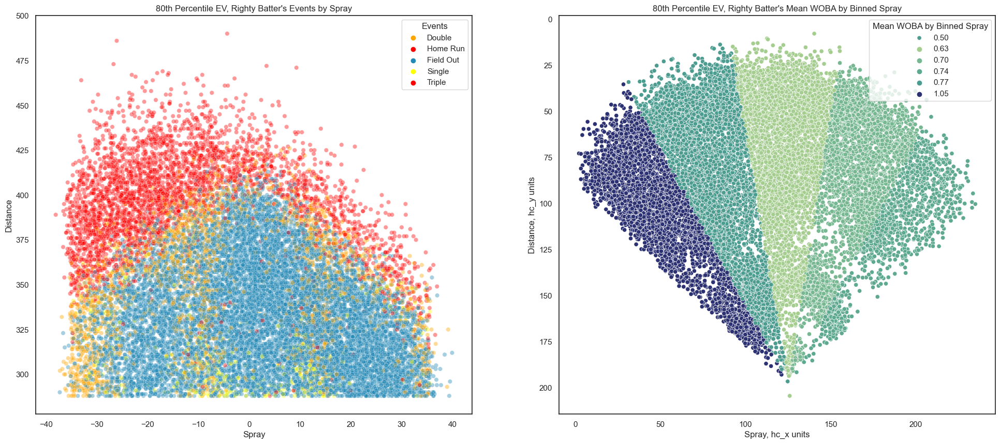

In [20]:
#----------- Top EV Righty Pull Results ----------------------

#limit spray
Righty_Top_25_hit_distance_sc_percentile_limited_spray = Righty_Top_25_hit_distance_sc_percentile.loc[Righty_Top_25_hit_distance_sc_percentile['spray_angle'] < 40]
Righty_Top_25_hit_distance_sc_percentile_limited_spray = Righty_Top_25_hit_distance_sc_percentile_limited_spray.loc[Righty_Top_25_hit_distance_sc_percentile_limited_spray['spray_angle'] > -40]

#----------- Righty Batter Spray Splits vs Mean WOBA ----------------------

#limit spray
Righty_Top_25_launch_speed_percentile_limited_spray = Righty_Top_25_launch_speed_percentile.loc[Righty_Top_25_launch_speed_percentile['spray_angle'] < 38]
Righty_Top_25_launch_speed_percentile_limited_spray = Righty_Top_25_launch_speed_percentile_limited_spray.loc[Righty_Top_25_launch_speed_percentile_limited_spray['spray_angle'] > -38]

bins = np.linspace(Righty_Top_25_launch_speed_percentile_limited_spray['spray_angle'].min(),Righty_Top_25_launch_speed_percentile_limited_spray['spray_angle'].max(),6)

Righty_Top_25_launch_speed_percentile_limited_spray['spray_angle_binned'] = pd.cut(Righty_Top_25_launch_speed_percentile_limited_spray['spray_angle'], bins)

Righty_Top_25_launch_speed_percentile_limited_spray['spray_angle_binned'] = Righty_Top_25_launch_speed_percentile_limited_spray['spray_angle_binned'].astype(str)

pull_woba = Righty_Top_25_launch_speed_percentile_limited_spray.groupby('spray_angle_binned')['woba_value'].mean()

righty_spray_binned_woba = pull_woba.to_dict()

Righty_Top_25_launch_speed_percentile_limited_spray['spray_binned_woba_mean'] = Righty_Top_25_launch_speed_percentile_limited_spray['spray_angle_binned'].map(righty_spray_binned_woba)

Righty_Top_25_launch_speed_percentile_limited_spray['launch_speed_percentile'] = Righty_Top_25_launch_speed_percentile_limited_spray['launch_speed'].rank(pct=True)

#------------------- Graph --------------------------

plt.figure(figsize=(50,10))
sns.set_theme(style="white")


plt.subplot(142)
ax = sns.scatterplot(data = Righty_Top_25_hit_distance_sc_percentile_limited_spray, 
                x=Righty_Top_25_hit_distance_sc_percentile_limited_spray.spray_angle, 
                y=Righty_Top_25_hit_distance_sc_percentile_limited_spray.hit_distance_sc, 
                hue = Righty_Top_25_hit_distance_sc_percentile_limited_spray.Events, 
                alpha = 0.4, 
                palette=pal)

ax.set(xlabel='Spray')
ax.set(ylabel='Distance')
plt.legend(title = "Events",loc = 'upper right')
plt.title("80th Percentile EV, Righty Batter's Events by Spray")

plt.subplot(143)
ax = sns.scatterplot(data = Righty_Top_25_launch_speed_percentile_limited_spray, 
                     x=Righty_Top_25_launch_speed_percentile_limited_spray.hc_x, 
                     y=Righty_Top_25_launch_speed_percentile_limited_spray.hc_y, 
                     hue = Righty_Top_25_launch_speed_percentile_limited_spray.spray_binned_woba_mean, palette='crest')
ax.invert_yaxis()
ax.set(xlabel='Spray, hc_x units')
ax.set(ylabel='Distance, hc_y units')
plt.legend(title = "Mean WOBA by Binned Spray",loc = 'upper right', labels = ['0.50','0.63','0.70','0.74', '0.77','1.05'])

plt.title("80th Percentile EV, Righty Batter's Mean WOBA by Binned Spray")

plt.show()

# **Dynamic Distance Pull Rate**

This documentation explains the importance of the graphs below, which show the relationship between pull% and hit distance for righty batters in the top 25% of exit velocity.

**Graph 1: 80th Percentile EV, Righty Batter's Events by Pull%**

This graph shows the pull% vs. hit distance for righty batters in the top 25% of exit velocity, with different colors representing different types of batted ball events (e.g., home runs, singles, doubles).

The graph shows that righty batters who hit the ball with a high exit velocity and a high pull% are more likely to hit home runs. In contrast, righty batters who hit the ball with a high exit velocity and a low pull% are more likely to hit singles and doubles.

**Graph 2: 80th Percentile EV, Pull% vs Mean Distance**

This graph shows the pull% vs. mean hit distance for righty batters in the top 25% of exit velocity, with a line representing the average distance for each bin of pull%.

The graph shows that righty batters who hit the ball with a high exit velocity and a high pull% tend to have a higher mean hit distance than righty batters who hit the ball with a high exit velocity and a low pull%. This is because pull-hit balls are more likely to result in home runs and doubles, which travel further than singles and outs.

**Implications**

The insights gained from these graphs can be used by righty batters and coaches to develop hitting strategies. For example, a righty batter who wants to hit more home runs should focus on hitting the ball with a high exit velocity and a high pull%. A coach can also use these graphs to identify batters who may be struggling to hit the ball with a high pull%, and then provide them with coaching to improve their technique.

**Conclusion**

The graphs above provide valuable insights into the relationship between pull% and hit distance for righty batters. These insights can be used by righty batters and coaches to develop hitting strategies.

Text(0.5, 1.0, '80th Percentile EV, Pull% vs Mean Distance')

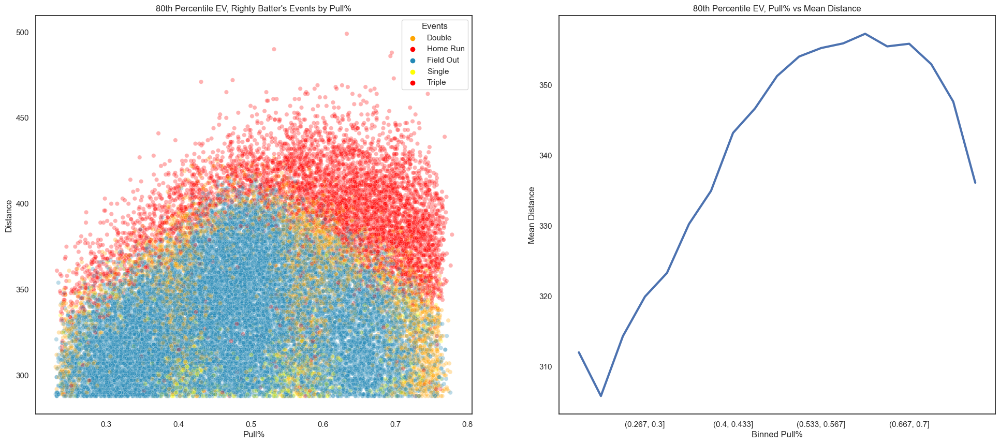

In [21]:
#----------- Limit Pull% ----------------------


Top_25_hit_distance_sc_percentile_limited_pull_percent = Top_25_hit_distance_sc_percentile.loc[Top_25_hit_distance_sc_percentile['pull_percent'] < .78]
Top_25_hit_distance_sc_percentile_limited_pull_percent = Top_25_hit_distance_sc_percentile_limited_pull_percent.loc[Top_25_hit_distance_sc_percentile_limited_pull_percent['pull_percent'] > .23]


#----------- Top EV Mean Distance by Pull% ----------------------

bins = np.linspace(0,1,31)
Top_25_hit_distance_sc_percentile['pull_percent_binned'] = pd.cut(Top_25_hit_distance_sc_percentile['pull_percent'], bins)
pull_percent_binned_mean_hit_distance_sc = Top_25_hit_distance_sc_percentile.groupby('pull_percent_binned')['hit_distance_sc'].mean()

# create new df and reindex
pull_percent_binned_mean_hit_distance_sc = pd.DataFrame(pull_percent_binned_mean_hit_distance_sc)
pull_percent_binned_mean_hit_distance_sc = pull_percent_binned_mean_hit_distance_sc.reset_index()

#chop to make nice viz
pull_percent_binned_mean_hit_distance_sc = pull_percent_binned_mean_hit_distance_sc.iloc[5:24,:]

#------------------- Graph --------------------------

plt.figure(figsize=(50,10))
sns.set_theme(style="white")


plt.subplot(142)
chart = sns.scatterplot(data = Top_25_hit_distance_sc_percentile_limited_pull_percent, 
                        x=Top_25_hit_distance_sc_percentile_limited_pull_percent.pull_percent, 
                        y=Top_25_hit_distance_sc_percentile_limited_pull_percent.hit_distance_sc, 
                        hue = Top_25_hit_distance_sc_percentile_limited_pull_percent.Events, 
                        alpha = 0.3, 
                        palette=pal)
chart.set(xlabel='Pull%')
chart.set(ylabel='Distance')
plt.legend(title = "Events",loc = 'upper right')
plt.title("80th Percentile EV, Righty Batter's Events by Pull%")

plt.subplot(143)
chart = sns.lineplot(data=pull_percent_binned_mean_hit_distance_sc, 
                     x=pull_percent_binned_mean_hit_distance_sc.pull_percent_binned.astype(str), 
                     y=pull_percent_binned_mean_hit_distance_sc.hit_distance_sc, 
                     linewidth = 3)
chart.set(xticks=[3,7,11,15])
chart.set(xlabel='Binned Pull%')
chart.set(ylabel='Mean Distance')
plt.title('80th Percentile EV, Pull% vs Mean Distance')


# **Dynamic Distance LA Rate**

These graphs show the relationship between launch angle and hit distance for all batted balls within a launch angle range of -15 to 80 degrees. The first graph shows that batted balls with a launch angle between 8 and 32 degrees tend to travel the furthest, on average. This is because batted balls with a launch angle in this range have a good balance of backspin and lift, which helps them to carry further.

The second graph shows that batted balls with a launch angle between 8 and 32 degrees also have the highest mean hit distance. This is because batted balls with a launch angle in this range are more likely to result in home runs and doubles, which travel further than singles and outs.

**Graph 1: Events vs LA & Distance:** This graph shows the launch angle vs. hit distance for all batted balls within a launch angle range of -15 to 80 degrees, with different colors representing different types of batted ball events (e.g., home runs, singles, doubles).

**Graph 2: Binned LA vs Mean Distance:** This graph shows the launch angle vs. mean hit distance, with a line representing the average distance for each bin of launch angle.

**Implications**

These insights can be used by hitters and coaches to develop hitting strategies. For example, a hitter who wants to hit for more power should focus on hitting the ball with a launch angle between 8 and 32 degrees. A coach can also use these graphs to identify hitters who may be struggling to hit the ball with a launch angle in this range, and then provide them with coaching to improve their technique.

**Conclusion**

The graphs above provide valuable insights into the relationship between launch angle and hit distance for all batted balls within a launch angle range of -15 to 80 degrees. These insights can be used by hitters and coaches to develop hitting strategies.

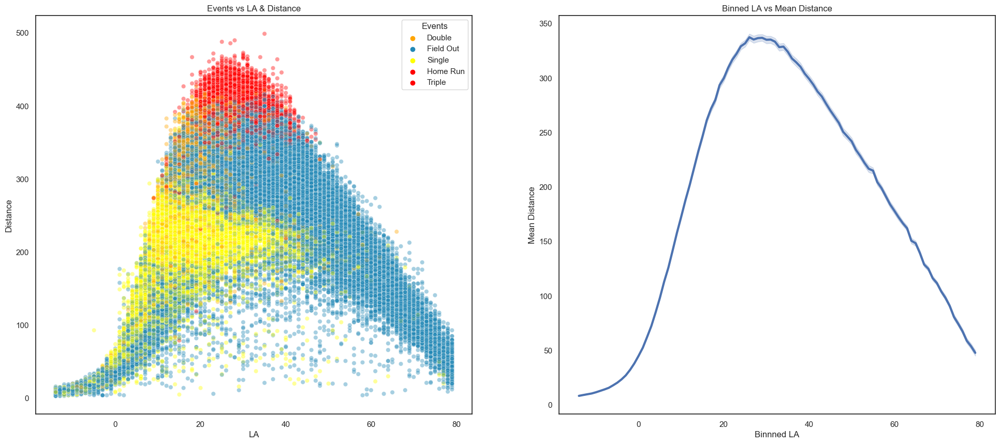

In [22]:
#----------- Relevant LAs ----------------------

data_limited_LA = data.loc[data['launch_angle'] < 80]
data_limited_LA = data_limited_LA.loc[data_limited_LA['launch_angle'] > -15]

#------------------- Graph --------------------------

plt.figure(figsize=(50,10))
sns.set_theme(style="white")

plt.subplot(142)
chart = sns.scatterplot(data = data_limited_LA, 
                x=data_limited_LA.launch_angle, 
                y=data_limited_LA.hit_distance_sc, 
                alpha = 0.4, 
                hue = data_limited_LA.Events, 
                palette=pal)
chart.set(xlabel='LA')
chart.set(ylabel='Distance')
plt.title('Events vs LA & Distance')

plt.subplot(143)
chart = sns.lineplot(data = data_limited_LA, 
             x=data_limited_LA.launch_angle, 
             y=data_limited_LA.hit_distance_sc,
             linewidth = 3)
chart.set(xlabel='Binnned LA')
chart.set(ylabel='Mean Distance')
plt.title('Binned LA vs Mean Distance')

plt.show()

# **Dynamic Pop Release Speed Rate**

These graphs show the relationship between release speed and Pop for the top 95% of batted balls in terms of launch_release_speed_percentile. The first graph shows that batted balls with a high release speed and a high Pop are more likely to result in home runs. In contrast, batted balls with a high release speed and a low Pop are more likely to result in singles and doubles.

The second graph shows that batted balls with a high release speed and a high Pop tend to have a higher mean Pop than batted balls with a high release speed and a low Pop. This is because batted balls with a high release speed and a high Pop are more likely to result in home runs, which have a higher Pop than singles and doubles.

**Graph 1: 80th Percentile EV, Pop vs Release Speed:** This graph shows the release speed vs. Pop for the top 95% of batted balls in terms of launch_release_speed_percentile, with different colors representing different types of batted ball events (e.g., home runs, singles, doubles).

**Graph 2: 80th Percentile EV, Binned Release Speed vs Mean Pop:** This graph shows the release speed vs. mean Pop, with a line representing the average Pop for each bin of release speed.

**Implications**

These insights can be used by hitters and coaches to develop hitting strategies. For example, a hitter who wants to hit for more power should focus on hitting the ball with a high release speed and a high Pop. A coach can also use these graphs to identify hitters who may be struggling to hit the ball with a high Pop, and then provide them with coaching to improve their technique.

**Conclusion**

The graphs above provide valuable insights into the relationship between release speed and Pop for the top 95% of batted balls in terms of launch_release_speed_percentile. These insights can be used by hitters and coaches to develop hitting strategies.

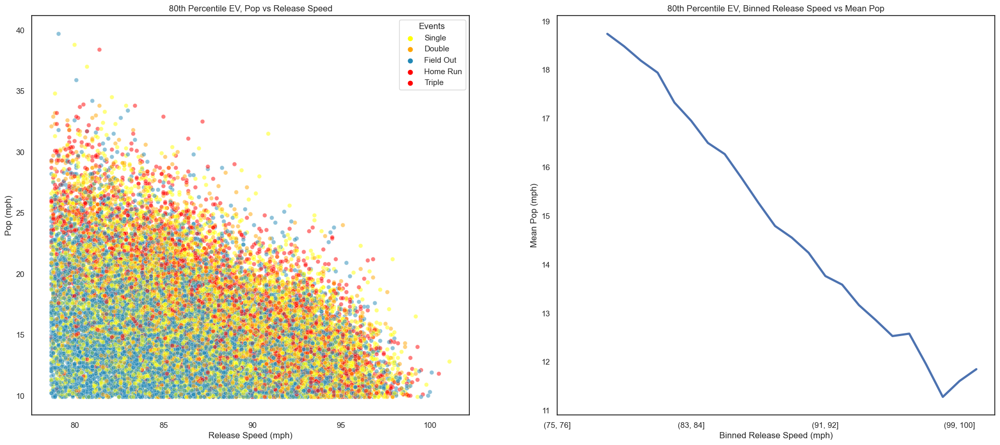

In [23]:
pd.set_option('mode.chained_assignment', None)

#------------------- Top Barrels + Excluding low pitch outliers --------------------------

Top_Pop = Top_95_launch_release_speed_percentile.loc[Top_95_launch_release_speed_percentile['Pop_percentile'] > 0.74]

#------------------- Binned Release Speed --------------------------

bins = []
for i in range(75, 102, 1):
    bins.append(i)

Top_Pop['release_speed_binned'] = pd.cut(Top_Pop['release_speed'], bins)

release_speed_binned_mean_Pop = Top_Pop.groupby('release_speed_binned')['Pop'].mean()
release_speed_binned_mean_Pop = pd.DataFrame(release_speed_binned_mean_Pop)
release_speed_binned_mean_Pop = release_speed_binned_mean_Pop.reset_index()

#------------------- Graph --------------------------

plt.figure(figsize=(50,10))
sns.set_theme(style="white")


plt.subplot(142)
chart = sns.scatterplot(data = Top_Pop, 
                        x=Top_Pop.release_speed, 
                        y=Top_Pop.Pop,  
                        hue = Top_Pop.Events, 
                        alpha = 0.5, 
                        palette=pal)

chart.set(xlabel='Release Speed (mph)')
chart.set(ylabel='Pop (mph)')
plt.title("80th Percentile EV, Pop vs Release Speed")

plt.subplot(143)
chart = sns.lineplot(data=release_speed_binned_mean_Pop, 
                     x=release_speed_binned_mean_Pop.release_speed_binned.astype(str), 
                     y=release_speed_binned_mean_Pop.Pop, 
                     linewidth = 3)
chart.set(xticks=[0,8,16,24])
chart.set(xlabel='Binned Release Speed (mph)')
chart.set(ylabel='Mean Pop (mph)')
plt.title("80th Percentile EV, Binned Release Speed vs Mean Pop")

plt.show()

# **Pop Spray**

These graphs show the relationship between Pop and spray angle for righty batters. The first graph shows that righty batters who hit the ball with a high Pop tend to have a higher mean WOBA, regardless of spray angle. However, righty batters who hit the ball with a high Pop and a pull spray angle tend to have the highest mean WOBA.

The second graph shows that righty batters who hit the ball with a high pull spray angle tend to have a higher mean Pop. This is likely because pull-hit balls are more likely to result in home runs, which have a higher Pop than singles and doubles.

**Graph 1: 80th Percentile EV, Righty Batter's Mean WOBA by Binned Pop:** This graph shows the hc_x vs. hc_y for the top 95% of batted balls in terms of launch_release_speed_percentile, with different colors representing different bins of Pop. The size of the points represents the mean WOBA for each bin of Pop.

**Graph 2: Righty Batter's Mean Pop by Binned Spray:** This graph shows the hc_x vs. hc_y for all batted balls with a launch speed in the top 25% and a spray angle between -38 and 38 degrees, with different colors representing different bins of spray angle. The size of the points represents the mean Pop for each bin of spray angle.

**Implications**

These insights can be used by righty batters and coaches to develop hitting strategies. For example, a righty batter who wants to hit for more power should focus on hitting the ball with a high Pop and a pull spray angle. A coach can also use these graphs to identify righty batters who may be struggling to hit the ball with a high Pop or a pull spray angle, and then provide them with coaching to improve their technique.

**Conclusion**

The graphs above provide valuable insights into the relationship between Pop and spray angle for righty batters. These insights can be used by righty batters and coaches to develop hitting strategies.

In [24]:
#------------------- Top Pop + Excluding low pitch outliers + Righty Batters --------------------------

Top_Righty_Pops = Righty_batter_Top_95_launch_release_speed_percentile.loc[Righty_batter_Top_95_launch_release_speed_percentile['Pop_percentile'] > 0.74]

bins = np.linspace(10,40,6)

Top_Righty_Pops['Pop_binned'] = pd.cut(Top_Righty_Pops['Pop'], bins)

Top_Righty_Pops['Pop_binned'] = Top_Righty_Pops['Pop_binned'].astype(str)

woba_pop_binned = Top_Righty_Pops.groupby('Pop_binned')['woba_value'].mean()

woba_pop_binned = woba_pop_binned.to_dict()
Top_Righty_Pops['pop_binned_woba_mean'] = Top_Righty_Pops['Pop_binned'].map(woba_pop_binned)


In [25]:
Righty_batters_limited_spray = Righty_Top_25_launch_speed_percentile.loc[Righty_Top_25_launch_speed_percentile['spray_angle'] < 38]
Righty_batters_limited_spray = Righty_batters_limited_spray.loc[Righty_batters_limited_spray['spray_angle'] > -38]

bins = np.linspace(Righty_batters_limited_spray['spray_angle'].min(),Righty_batters_limited_spray['spray_angle'].max(),6)

Righty_batters_limited_spray['spray_angle_binned'] = pd.cut(Righty_batters_limited_spray['spray_angle'], bins)

Righty_batters_limited_spray['spray_angle_binned'] = Righty_batters_limited_spray['spray_angle_binned'].astype(str)

pull_woba = Righty_batters_limited_spray.groupby('spray_angle_binned')['Pop'].mean()

righty_spray_binned_woba = pull_woba.to_dict()

Righty_batters_limited_spray['spray_binned_pop_mean'] = Righty_batters_limited_spray['spray_angle_binned'].map(righty_spray_binned_woba)



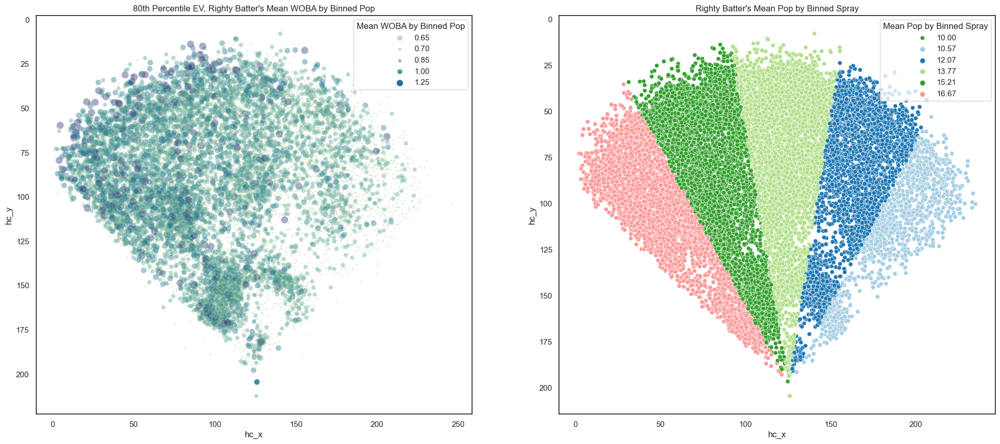

In [26]:
plt.figure(figsize=(50,10))
sns.set_theme(style="white")

plt.subplot(143)
ax = sns.scatterplot(data = Top_Righty_Pops, 
                     x=Top_Righty_Pops.hc_x, 
                     y=Top_Righty_Pops.hc_y, 
                     hue = Top_Righty_Pops.pop_binned_woba_mean, 
                     alpha = 0.4,
                     size=Top_Righty_Pops.pop_binned_woba_mean,
                     sizes=(5,100),
                     palette='crest')
ax.invert_yaxis()
ax.set(xlabel='hc_x')
ax.set(ylabel='hc_y')
plt.legend(title = "Mean WOBA by Binned Pop",loc = 'upper right', labels = ['0.65','0.70','0.85', '1.00','1.25'])
plt.title("80th Percentile EV, Righty Batter's Mean WOBA by Binned Pop")

plt.subplot(144)
ax = sns.scatterplot(data = Righty_batters_limited_spray, 
                     x=Righty_batters_limited_spray.hc_x, 
                     y=Righty_batters_limited_spray.hc_y, 
                     hue = Righty_batters_limited_spray.spray_binned_pop_mean, 
                     palette='Paired')
ax.invert_yaxis()
ax.set(xlabel='hc_x')
ax.set(ylabel='hc_y')
plt.legend(title = "Mean Pop by Binned Spray",loc = 'upper right', labels = ['10.00','10.57','12.07','13.77', '15.21','16.67'])
plt.title("Righty Batter's Mean Pop by Binned Spray")

plt.show()

# **Barrel Spray**

These graphs show the relationship between barrel count and spray angle for righty batters. The first graph shows that righty batters who hit the ball with a pull spray angle tend to have a higher barrel count.

The second graph shows that righty batters who hit the ball with a high pull spray angle tend to have a higher barrel count. This is likely because pull-hit balls are more likely to result in barrels, which are characterized by a high launch speed and exit velocity.

**Graph 1: Righty Batter's Barrel Count by Binned Spray:** This graph shows a bar chart of the barrel count for each bin of spray angle.

**Graph 2: Righty Batter's Barrel Count by Binned Spray:** This graph shows a scatter plot of the hc_x vs. hc_y for all batted balls with a spray angle between -38 and 38 degrees, with different colors representing different bins of spray angle. The size of the points represents the barrel count for each bin of spray angle.

**Implications**

These insights can be used by righty batters and coaches to develop hitting strategies. For example, a righty batter who wants to hit for more power should focus on hitting the ball with a pull spray angle. A coach can also use these graphs to identify righty batters who may be struggling to hit the ball with a pull spray angle, and then provide them with coaching to improve their technique.

**Conclusion**

The graphs above provide valuable insights into the relationship between barrel count and spray angle for righty batters. These insights can be used by righty batters and coaches to develop hitting strategies.


In [27]:
Righty_batters_limited_spray = Righty_data.loc[Righty_data['spray_angle'] < 38]
Righty_batters_limited_spray = Righty_batters_limited_spray.loc[Righty_batters_limited_spray['spray_angle'] > -38]

bins = np.linspace(Righty_batters_limited_spray['spray_angle'].min(),Righty_batters_limited_spray['spray_angle'].max(),6)

Righty_batters_limited_spray['spray_angle_binned'] = pd.cut(Righty_batters_limited_spray['spray_angle'], bins)

Righty_batters_limited_spray['spray_angle_binned'] = Righty_batters_limited_spray['spray_angle_binned'].astype(str)

pull_woba = Righty_batters_limited_spray.groupby('spray_angle_binned')['is_barrel'].count()

righty_spray_binned_woba = pull_woba.to_dict()

Righty_batters_limited_spray['spray_binned_bar_count'] = Righty_batters_limited_spray['spray_angle_binned'].map(righty_spray_binned_woba)



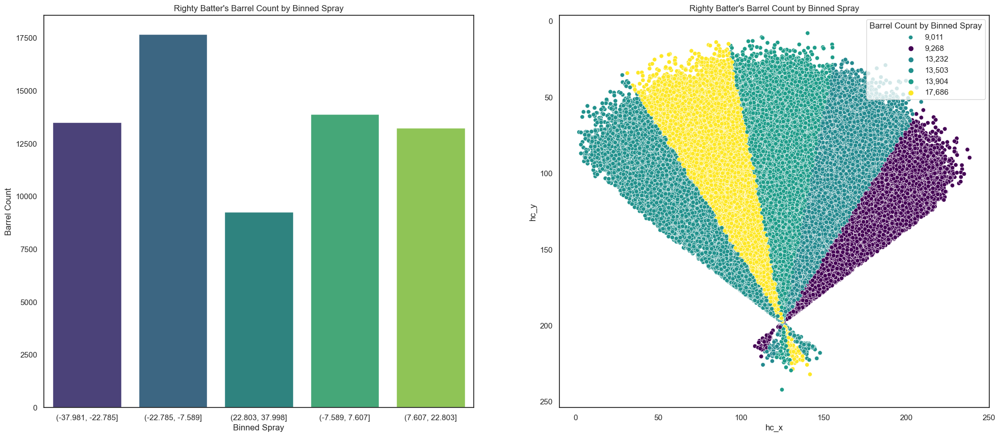

In [28]:
plt.figure(figsize=(50,10))
sns.set_theme(style="white")

plt.subplot(141)
chart = sns.barplot(data = Righty_batters_limited_spray, 
                        x=Righty_batters_limited_spray.spray_angle_binned, 
                        y=Righty_batters_limited_spray.spray_binned_bar_count,
                        palette='viridis')
chart.set(xlabel='Binned Spray')
chart.set(ylabel='Barrel Count')
plt.title("Righty Batter's Barrel Count by Binned Spray")


plt.subplot(142)
ax = sns.scatterplot(data = Righty_batters_limited_spray, 
                     x=Righty_batters_limited_spray.hc_x, 
                     y=Righty_batters_limited_spray.hc_y, 
                     hue = Righty_batters_limited_spray.spray_binned_bar_count,
                     palette='viridis')
ax.invert_yaxis()
ax.set(xlabel='hc_x')
ax.set(ylabel='hc_y')
plt.title("Righty Batter's Barrel Count by Binned Spray")
plt.legend(title = "Barrel Count by Binned Spray",loc = 'upper right', labels = ['9,011','9,268','13,232','13,503','13,904', '17,686'])


plt.show()

# **Sum HeatMap, LA vs Pull% for Distance, Woba, and Pop**

These heatmaps show the relationship between distance, WOBA, Pop, launch angle, and pull%. The distance heatmap shows that batted balls with a high launch angle and a high pull% tend to travel the furthest. The WOBA heatmap shows that batted balls with a high launch angle and a high pull% also tend to have the highest WOBA. This is because batted balls with a high launch angle and a high pull% are more likely to result in home runs, which travel further and have a higher WOBA than singles and doubles.

The Pop heatmap shows that batted balls with a high launch angle and a high pull% tend to have the highest Pop. This is because batted balls with a high launch angle and a high pull% are more likely to result in barrels, which have a higher Pop than non-barrels.

**Distance vs Pull% & LA:** This heatmap shows the mean hit distance for each bin of launch angle and pull%.

**WOBA vs Pull% & LA:** This heatmap shows the mean woba for each bin of launch angle and pull%.

**Pop vs Pull% & LA:** This heatmap shows the mean Pop for each bin of launch angle and pull%.

**Implications**

These insights can be used by hitters and coaches to develop hitting strategies. For example, a hitter who wants to hit for more power should focus on hitting the ball with a high launch angle and a high pull%. A coach can also use these heatmaps to identify hitters who may be struggling to hit the ball with a high launch angle or a high pull%, and then provide them with coaching to improve their technique.

**Conclusion**

The heatmaps above provide valuable insights into the relationship between distance, WOBA, Pop, launch angle, and pull%. These insights can be used by hitters and coaches to develop hitting strategies.


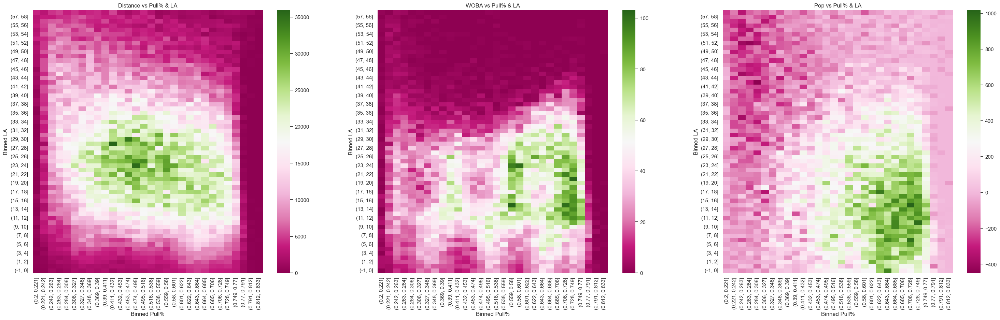

In [29]:
hitting_df = data

hitting_df_binned = hitting_df

#---------------LA--------------------

bins = []
for i in range(-1, 60, 1):
    bins.append(i)

hitting_df_binned['launch_angle_binned'] = pd.cut(hitting_df_binned['launch_angle'], bins)

#---------------Pull%-------------

bins = np.linspace(0.2,.833,31)

hitting_df_binned['pull_percent_binned'] = pd.cut(hitting_df['pull_percent'], bins)

non_coors_new_rel_terms_dis = hitting_df_binned.pivot_table(index='launch_angle_binned', columns='pull_percent_binned', values='hit_distance_sc', aggfunc='sum')

non_coors_new_rel_terms_woba = hitting_df_binned.pivot_table(index='launch_angle_binned', columns='pull_percent_binned', values='woba_value', aggfunc='sum')

non_coors_new_rel_terms_pop = hitting_df_binned.pivot_table(index='launch_angle_binned', columns='pull_percent_binned', values='Pop', aggfunc='sum')

# ---------------Graph-------------

plt.figure(figsize=(50,10))
sns.set_theme(style="white")

plt.subplot(141)
ax = sns.heatmap(non_coors_new_rel_terms_dis,cmap="PiYG")
ax.invert_yaxis()
ax.set(xlabel='Binned Pull%')
ax.set(ylabel='Binned LA')
plt.title('Distance vs Pull% & LA')

plt.subplot(142)
ax = sns.heatmap(non_coors_new_rel_terms_woba,cmap="PiYG")
ax.invert_yaxis()
ax.set(xlabel='Binned Pull%')
ax.set(ylabel='Binned LA')
plt.title('WOBA vs Pull% & LA')

plt.subplot(143)
ax = sns.heatmap(non_coors_new_rel_terms_pop,cmap="PiYG")
ax.invert_yaxis()
ax.set(xlabel='Binned Pull%')
ax.set(ylabel='Binned LA')
plt.title('Pop vs Pull% & LA')

plt.show()

# **Mean HeatMap, LA vs Pull% for Distance, Woba, and Pop**

These heatmaps show the relationship between distance, WOBA, Pop, launch angle, and pull% for non-Coors Field batted balls. The distance heatmap shows that batted balls with a high launch angle and a high pull% tend to travel the furthest. The WOBA heatmap shows that batted balls with a high launch angle and a high pull% also tend to have the highest WOBA. This is because batted balls with a high launch angle and a high pull% are more likely to result in home runs, which travel further and have a higher WOBA than singles and doubles.

The Pop heatmap shows that batted balls with a high launch angle and a high pull% tend to have the highest Pop. This is because batted balls with a high launch angle and a high pull% are more likely to result in barrels, which have a higher Pop than non-barrels.

**Distance vs Pull% & LA:** This heatmap shows the mean hit distance for each bin of launch angle and pull%.

**WOBA vs Pull% & LA:** This heatmap shows the mean woba for each bin of launch angle and pull%.

**Pop vs Pull% & LA:** This heatmap shows the mean Pop for each bin of launch angle and pull%.

**Implications**

These insights can be used by hitters and coaches to develop hitting strategies. For example, a hitter who wants to hit for more power should focus on hitting the ball with a high launch angle and a high pull%. A coach can also use these heatmaps to identify hitters who may be struggling to hit the ball with a high launch angle or a high pull%, and then provide them with coaching to improve their technique.

**Conclusion**

The heatmaps above provide valuable insights into the relationship between distance, WOBA, Pop, launch angle, and pull% for non-Coors Field batted balls. These insights can be used by hitters and coaches to develop hitting strategies.

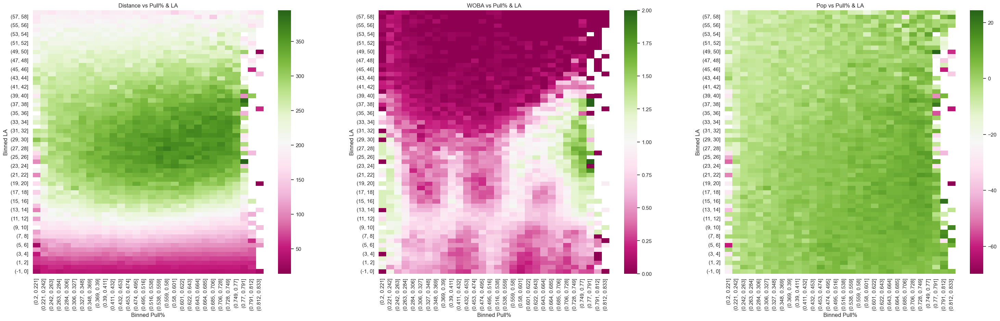

In [30]:
hitting_df = data

hitting_df_binned = hitting_df

#---------------LA--------------------

bins = []
for i in range(-1, 60, 1):
    bins.append(i)

hitting_df_binned['launch_angle_binned'] = pd.cut(hitting_df_binned['launch_angle'], bins)

#---------------Pull%-------------

bins = np.linspace(0.2,.833,31)

hitting_df_binned['pull_percent_binned'] = pd.cut(hitting_df['pull_percent'], bins)

non_coors_new_rel_terms_dis = hitting_df_binned.pivot_table(index='launch_angle_binned', columns='pull_percent_binned', values='hit_distance_sc', aggfunc='mean')

non_coors_new_rel_terms_woba = hitting_df_binned.pivot_table(index='launch_angle_binned', columns='pull_percent_binned', values='woba_value', aggfunc='mean')

non_coors_new_rel_terms_bar = hitting_df_binned.pivot_table(index='launch_angle_binned', columns='pull_percent_binned', values='Pop', aggfunc='mean')

# ---------------Graph-------------

plt.figure(figsize=(50,10))
sns.set_theme(style="white")

plt.subplot(141)
ax = sns.heatmap(non_coors_new_rel_terms_dis,cmap="PiYG")
#add correct lables and axis titles---------------------------------------------------------
ax.invert_yaxis()
ax.set(xlabel='Binned Pull%')
ax.set(ylabel='Binned LA')
plt.title('Distance vs Pull% & LA')

plt.subplot(142)
ax = sns.heatmap(non_coors_new_rel_terms_woba,cmap="PiYG")
ax.invert_yaxis()
ax.set(xlabel='Binned Pull%')
ax.set(ylabel='Binned LA')
plt.title('WOBA vs Pull% & LA')

plt.subplot(143)
ax = sns.heatmap(non_coors_new_rel_terms_bar,cmap="PiYG")
ax.invert_yaxis()
ax.set(xlabel='Binned Pull%')
ax.set(ylabel='Binned LA')
plt.title('Pop vs Pull% & LA')

plt.show()

# **3D Scatter Plot of EV vs. LA vs. Pull% vs. Distance**

This 3D scatter plot shows the relationship between expected value (EV), launch angle (LA), pull percentage (Pull%), and distance for batted balls with a spray angle between -55 and 55 degrees and a launch speed greater than 50 miles per hour.

The x-axis represents launch speed, the y-axis represents pull percentage, and the z-axis represents launch angle. The size of the points represents the distance of the batted ball. The color of the points represents the expected value of the batted ball, with a darker color representing a higher expected value.

**Overview**

The plot shows that batted balls with a high launch angle, a high pull percentage, and a high launch speed tend to have the highest expected value. This is because batted balls with these characteristics are more likely to result in home runs, which have a higher expected value than singles and doubles.

The plot also shows that there is a correlation between distance and expected value. This is because batted balls that travel further are more likely to result in extra-base hits, which have a higher expected value than singles.

**Implications**

These insights can be used by hitters and coaches to develop hitting strategies. For example, a hitter who wants to hit for more power should focus on hitting the ball with a high launch angle, a high pull percentage, and a high launch speed. A coach can also use this plot to identify hitters who may be struggling to hit the ball with these characteristics, and then provide them with coaching to improve their technique.

**Conclusion**

The 3D scatter plot above provides valuable insights into the relationship between EV, LA, Pull%, and distance for batted balls with a spray angle between -55 and 55 degrees and a launch speed greater than 50 miles per hour. These insights can be used by hitters and coaches to develop hitting strategies.


In [31]:
scatter_3d = data

scatter_3d = scatter_3d.loc[scatter_3d['spray_angle'] < 55]
scatter_3d = scatter_3d.loc[scatter_3d['spray_angle'] > -55]

scatter_3d = scatter_3d[['hit_distance_sc','launch_angle', "launch_speed","pull_percent", "Events"]]

scatter_3d = scatter_3d.loc[scatter_3d['launch_angle'] > -5]
scatter_3d = scatter_3d.loc[scatter_3d['launch_angle'] < 55]


scatter_3d = scatter_3d.loc[scatter_3d['launch_speed'] > 50]


fig = px.scatter_3d(scatter_3d, 
                    x='launch_speed', 
                    y='pull_percent', 
                    z='launch_angle', 
                    color='hit_distance_sc',
                    opacity=0.3)

fig.update_layout(width=800, height=800, title = 'EV vs LA vs Pull% vs Distance')
         
fig.show()


# **3D Scatter Plot of EV vs. LA vs. Pull% vs. Events**

This 3D scatter plot shows the relationship between expected value (EV), launch angle (LA), pull percentage (Pull%), and event type (Events) for batted balls with a spray angle between -55 and 55 degrees and a launch speed greater than 50 miles per hour.

The x-axis represents launch speed, the y-axis represents pull percentage, and the z-axis represents launch angle. The color of the points represents the event type of the batted ball, with a different color representing each event type (single, double, triple, and home run).

**Overview**

The plot shows that batted balls with a high launch angle, a high pull percentage, and a high launch speed are more likely to result in home runs. This is because batted balls with these characteristics have a higher expected value, and home runs have the highest expected value of all event types.

The plot also shows that there is a correlation between event type and expected value. This is because batted balls that result in extra-base hits (doubles, triples, and home runs) have a higher expected value than batted balls that result in singles.

**Implications**

These insights can be used by hitters and coaches to develop hitting strategies. For example, a hitter who wants to hit for more power should focus on hitting the ball with a high launch angle, a high pull percentage, and a high launch speed. A coach can also use this plot to identify hitters who may be struggling to hit the ball with these characteristics, and then provide them with coaching to improve their technique.

**Conclusion**

The 3D scatter plot above provides valuable insights into the relationship between EV, LA, Pull%, and Events for batted balls with a spray angle between -55 and 55 degrees and a launch speed greater than 50 miles per hour. These insights can be used by hitters and coaches to develop hitting strategies.

**Additional notes**

The plot shows that there is some overlap between the different event types. For example, there are some batted balls with a high launch angle, a high pull percentage, and a high launch speed that resulted in singles or doubles. This is likely because there are other factors that influence the outcome of a batted ball, such as the pitch location, the exit velocity, and the defense.

Overall, the 3D scatter plot provides a good overview of the relationship between EV, LA, Pull%, and Events for batted balls with a spray angle between -55 and 55 degrees and a launch speed greater than 50 miles per hour. However, it is important to keep in mind that there are other factors that influence the outcome of a batted ball, and that the plot should not be used to make definitive predictions about the outcome of a particular batted ball.

In [32]:

scatter_3d_events = scatter_3d[scatter_3d['Events'].isin([ "Single", "Double",  "Triple", "Home Run"])]


fig = px.scatter_3d(scatter_3d_events, 
                    x='launch_speed', 
                    y='pull_percent', 
                    z='launch_angle', 
                    color='Events',
                    opacity=0.1)

fig.update_layout(width=800, height=800, title = 'EV vs LA vs Pull% vs Events')
         
fig.show()